In [113]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import math

In [92]:
def upscale(input, output, scale):
    image = Image.open(input).convert("RGB")
    width, height = image.size
    pixels = image.load()

    up_width = int(width*scale)
    up_height = int(height*scale)

    upscaled = Image.new(mode="RGB", size=(up_width, up_height))
    up_pixels = upscaled.load()

    for y in range(up_height):
        for x in range(up_width):
            old_x = int(x/scale)
            old_y = int(y/scale)
            up_pixels[x,y] = pixels[old_x,old_y]

    upscaled.save(output)
    upscaled.show()

In [93]:
def downscale(input, output, scale):
    image = Image.open(input).convert("RGB")
    width, height = image.size
    pixels = image.load()

    down_width = int(width/scale)
    down_height = int(height/scale)

    downscaled = Image.new(mode="RGB", size=(down_width, down_height))
    down_pixels = downscaled.load()

    for y in range(down_height):
        for x in range(down_width):
            old_x = int(x*scale)
            old_y = int(y*scale)
            down_pixels[x,y] = pixels[old_x,old_y]

    downscaled.save(output)
    downscaled.show()

In [94]:
def quantization(input, output, levels):
    image = Image.open(input).convert("L")
    image_array = np.array(image)

    factor = 256//levels
    quant_array = (image_array//factor)*factor

    quantized = Image.fromarray(quant_array.astype(np.uint8))
    quantized.save(output)
    quantized.show()

In [ ]:
def histogram_equalisation(input, output):
    image = Image.open(input).convert("L")
    image.show()
    hist = image.histogram()
    
    cdf = []
    cumsum = 0
    for i in hist:
        cumsum += i
        cdf.append(cumsum)
    
    cdf = [i/cumsum for i in cdf]
    
    cdf = [round(255*i) for i in cdf]
    
    pixels = np.array(image)
    new_pixels = np.zeros_like(pixels)
    for x in range(pixels.shape[0]):
        for y in range(pixels.shape[1]):
            new_pixels[x,y] = cdf[pixels[x,y]]

    equalized = Image.fromarray(new_pixels)
    equalized.save(output)
    equalized.show()

    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.title("Original Histogram")
    plt.xlabel("Pixel Intensity (0–255)")
    plt.ylabel("Frequency")
    plt.plot(hist, color='black')
    plt.grid(True)
    
    plt.subplot(1, 2, 2)
    plt.title("Equalized Histogram")
    plt.xlabel("Pixel Intensity (0–255)")
    plt.ylabel("Frequency")
    plt.plot(equalized.histogram(), color='blue')
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()

In [104]:
def negative(input, output):
    image = Image.open(input).convert("L")
    pixels = np.array(image)

    pixels = pixels / 255.0

    neg_pixels = 255 * (1 - pixels)

    negative_img = Image.fromarray(neg_pixels.astype(np.uint8))
    negative_img.save(output)
    negative_img.show()

In [97]:
def thresholding(input, output, threshold):
    image = Image.open(input).convert("L")
    pixels = np.array(image)

    pixels = pixels / 255.0
    
    new_pixels = np.zeros_like(pixels)
    for x in range(pixels.shape[0]):
        for y in range(pixels.shape[1]):
            if pixels[x,y] > threshold:
                new_pixels[x,y] = 255

    thresholded = Image.fromarray(new_pixels.astype(np.uint8))
    thresholded.save(output)
    thresholded.show()

In [116]:
def logarithmic(input, output):
    image = Image.open(input).convert("L")
    pixels = np.array(image)

    pixels = pixels / 255.0
    
    new_pixels = np.zeros_like(pixels)
    for x in range(pixels.shape[0]):
        for y in range(pixels.shape[1]):
            new_pixels[x,y] = 255 * math.log(1 + pixels[x,y])

    log_img = Image.fromarray(new_pixels.astype(np.uint8))
    log_img.save(output)
    log_img.show()

In [ ]:
def power_law(input, output, gamma):
    image = Image.open(input).convert("L")
    pixels = np.array(image)

    pixels = pixels / 255.0
    
    new_pixels = np.zeros_like(pixels)
    for x in range(pixels.shape[0]):
        for y in range(pixels.shape[1]):
            new_pixels[x,y] = 255 * math.pow(pixels[x,y], gamma)

    pow_img = Image.fromarray(new_pixels.astype(np.uint8))
    pow_img.save(output)
    pow_img.show()

In [131]:
def bit_plane_slicing(input, output, bit):
    image = Image.open(input).convert("L")
    pixels = np.array(image)

    bit_pixels = (pixels >> bit) & 1
    bit_pixels = bit_pixels * 255

    bit_img = Image.fromarray(bit_pixels.astype(np.uint8))
    bit_img.save(output)
    bit_img.show()

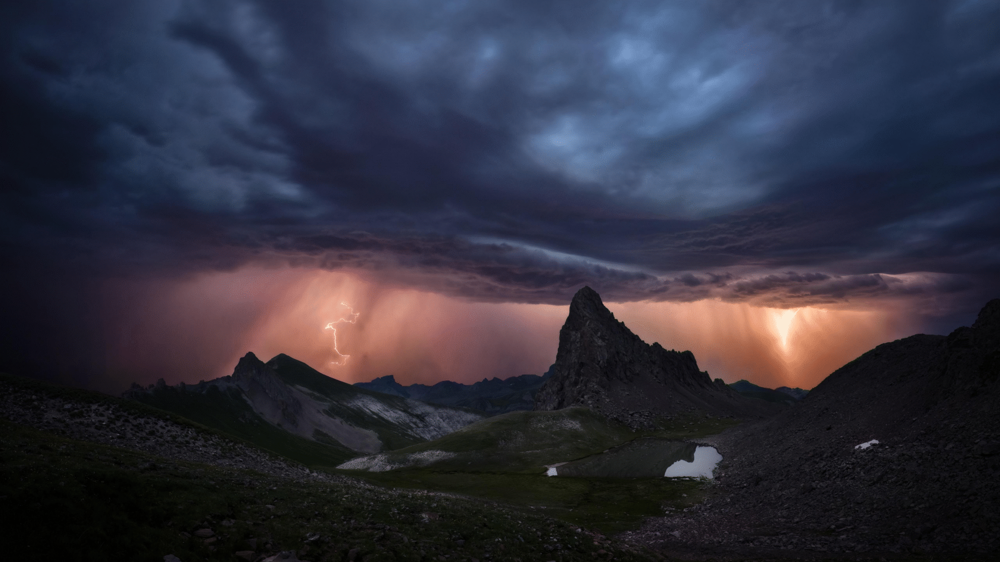

In [98]:
upscale("scenery.bmp", "scenery_up.bmp", 2)

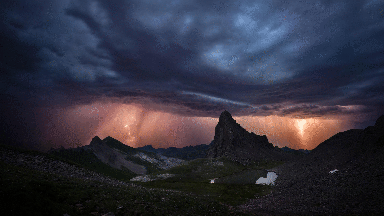

In [99]:
downscale("scenery.bmp", "scenery_down.bmp", 5)

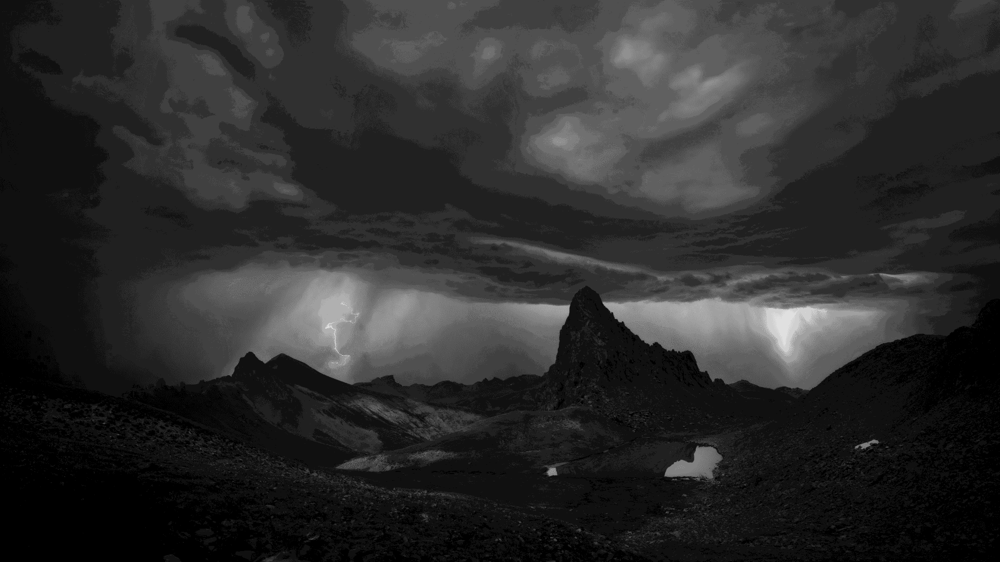

In [100]:
quantization("scenery.bmp", "scenery_4bit.bmp", 16)

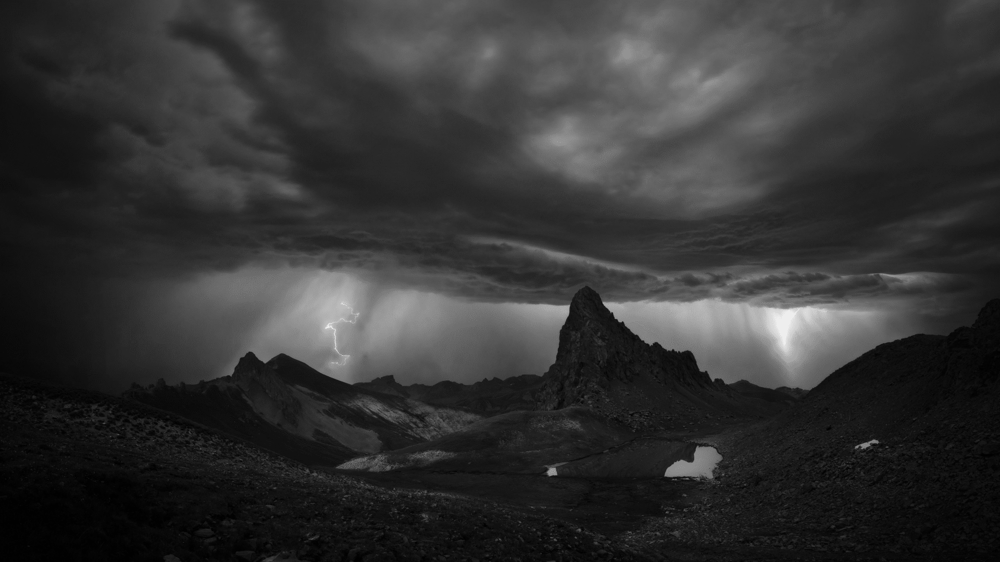

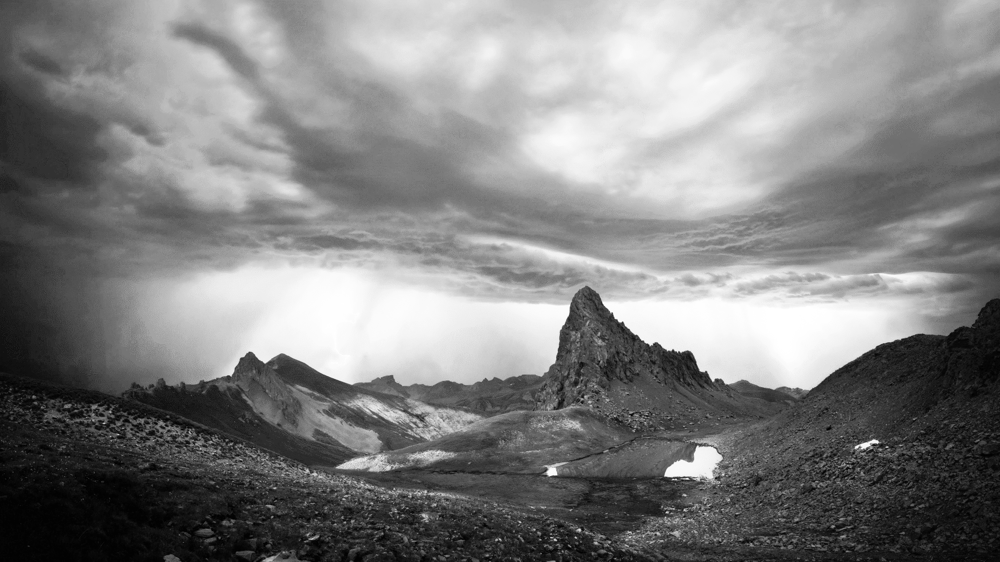

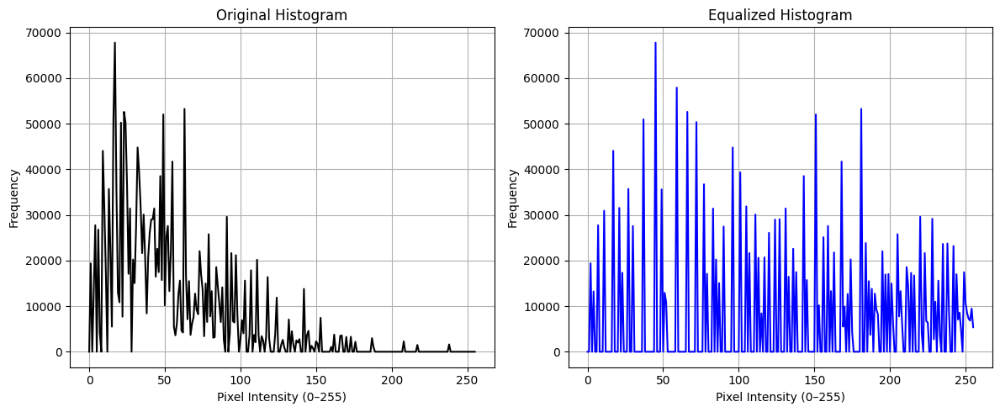

In [101]:
histogram_equalisation("scenery.bmp", "scenery_equalized.bmp")

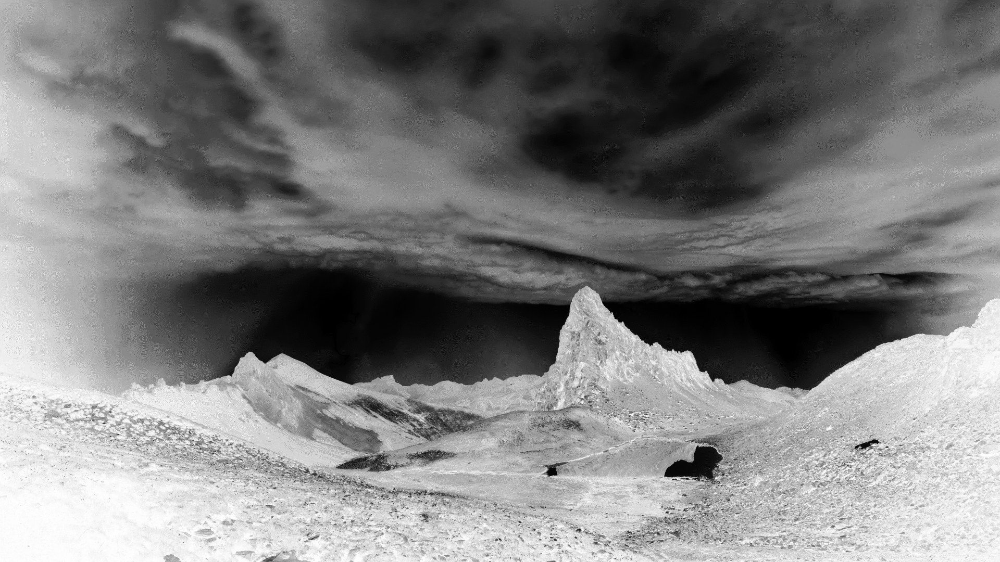

In [102]:
negative("scenery_equalized.bmp", "scenery_neg.bmp")

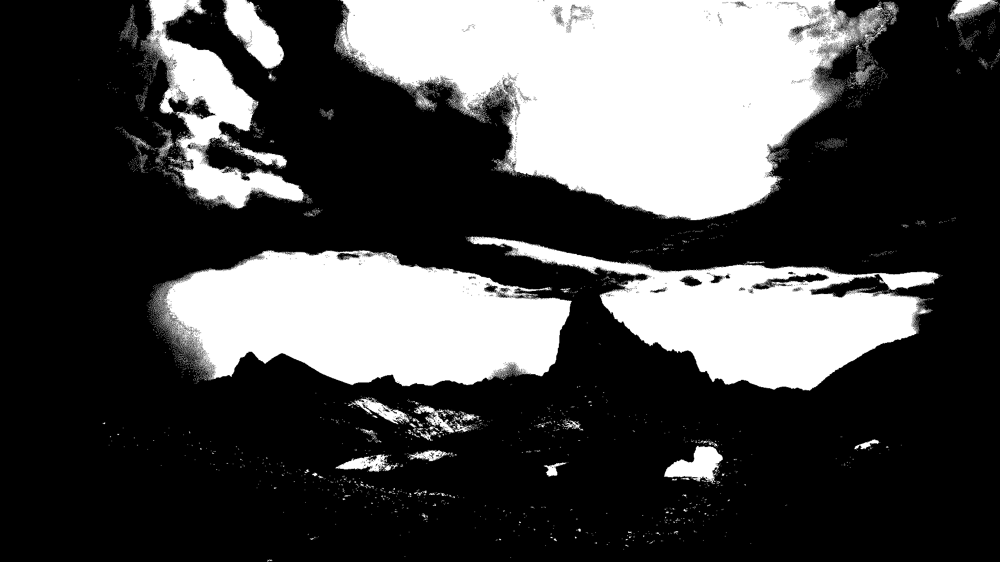

In [103]:
thresholding("scenery.bmp", "scenery_thresholded.bmp", 0.25)

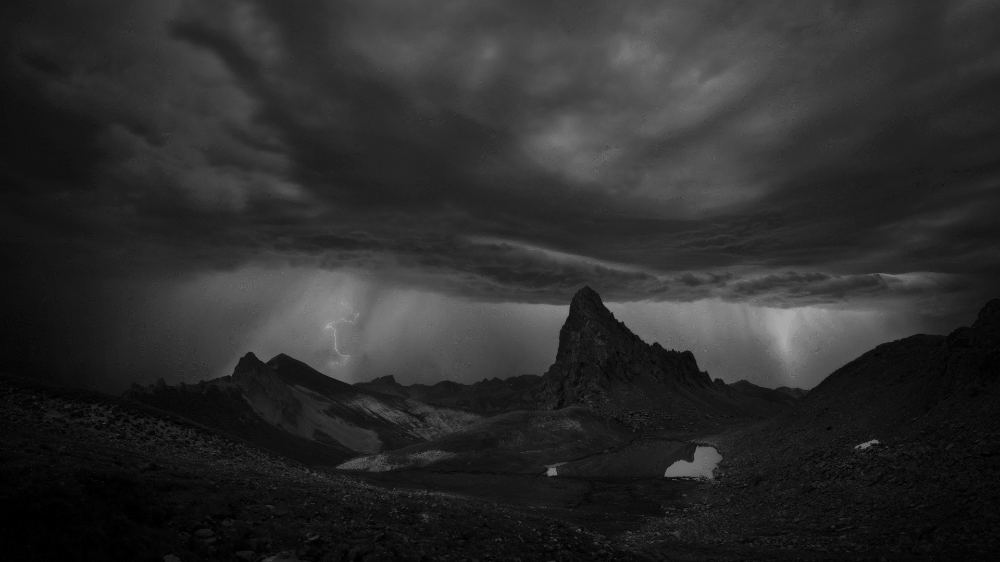

In [117]:
logarithmic("scenery.bmp", "scenery_log.bmp")

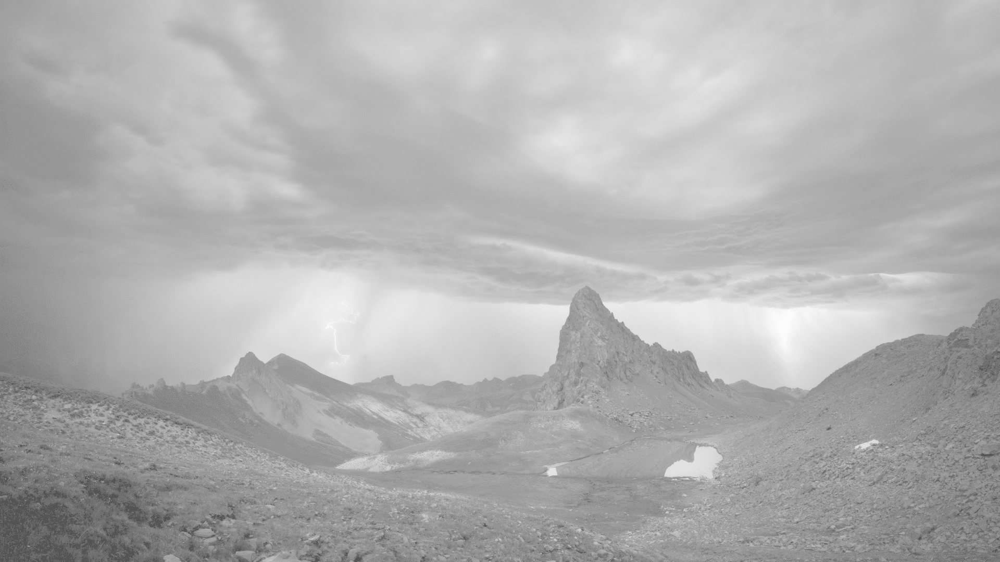

In [ ]:
power_law("scenery.bmp", "scenery_pow.bmp", 0.2)

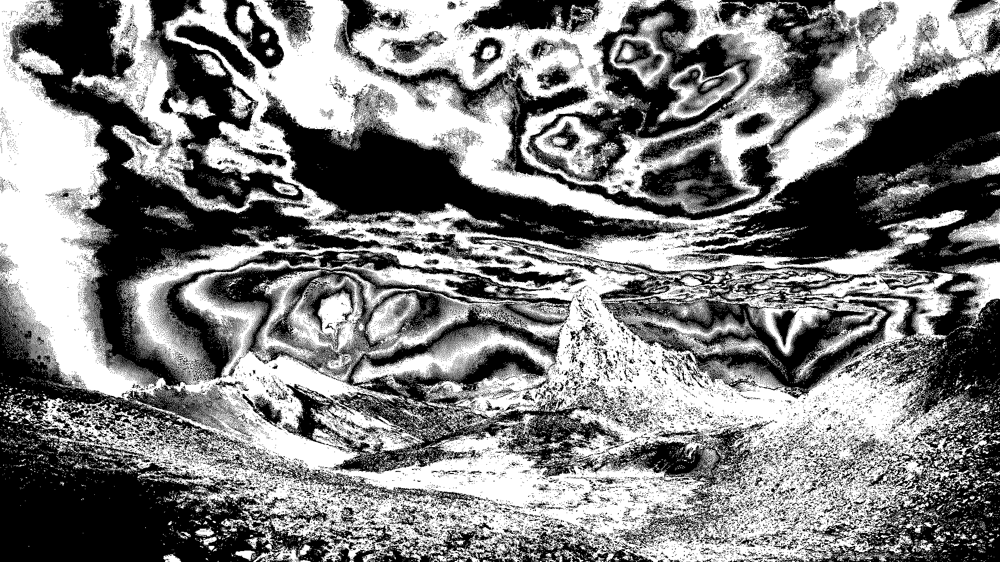

In [133]:
bit_plane_slicing("scenery.bmp", "scenery_bit_plane.bmp", 4)